In [22]:
import torch
import numpy as np
import scipy.stats
import scipy.linalg
import itertools

## Simulating data in case 2-2

In case that `p(u_1)=p(u_2)=p(u_3)=5/16, p(u_4)=1/16`

In [23]:
def datgenerate_2_2(N):
    
    ### Parameter setting
    phat_u = np.array([5/16,5/16,5/16,1/16])
    sigma = 0.1
    fraclist_W = [[1-sigma*3,sigma,sigma,sigma],
                  [sigma,1-sigma*3,sigma,sigma],
                  [sigma,sigma,1-sigma*3,sigma],
                  [sigma,sigma,sigma,1-sigma*3]]
    fraclist_Z = [[1-sigma*3,sigma,sigma,sigma],
                  [sigma,1-sigma*3,sigma,sigma],
                  [sigma,sigma,1-sigma*3,sigma],
                  [sigma,sigma,sigma,1-sigma*3]]
    fraclist_X = np.array([
        [21/46, 18/43, 18/43, 18/43],
        [ 9/34, 21/71,  9/34,  9/34],
        [ 9/34,  9/34, 21/71,  9/34],
        [ 9/34,  9/34,  9/34, 21/71],
    ])
    fraclist_Y = np.array([
        [1,1],
        [0,1],
        [1,0],
        [0,0],
    ])
    
    ### Generating data
    U = np.array([scipy.stats.rv_discrete(values=(range(4), phat_u)).rvs() for i in range(N)])
    W = np.array([scipy.stats.rv_discrete(values=(range(4), fraclist_W[U[i]])).rvs() for i in range(N)])
    Z = np.array([scipy.stats.rv_discrete(values=(range(4), fraclist_Z[U[i]])).rvs() for i in range(N)])    
    X = np.array([scipy.stats.binom(1, fraclist_X[U[i],W[i]]).rvs() for i in range(N)])
    Y = np.array([scipy.stats.binom(1, fraclist_Y[U[i],X[i]]).rvs() for i in range(N)])

    return U,W,Z,X,Y

## Estimating P1, P0, Q1, and Q0

In [24]:
def calculate_PQ(X,Y,Z,W):
    phat_z0x1 = (np.sum((Z==0) & (X==1))/np.sum(X==1))
    phat_z1x1 = (np.sum((Z==1) & (X==1))/np.sum(X==1))
    phat_z2x1 = (np.sum((Z==2) & (X==1))/np.sum(X==1))
    phat_z3x1 = (np.sum((Z==3) & (X==1))/np.sum(X==1))
    phat_z0x0 = (np.sum((Z==0) & (X==0))/(np.sum(X==0)))
    phat_z1x0 = (np.sum((Z==1) & (X==0))/(np.sum(X==0)))
    phat_z2x0 = (np.sum((Z==2) & (X==0))/(np.sum(X==0)))
    phat_z3x0 = (np.sum((Z==3) & (X==0))/(np.sum(X==0)))
    phat_w0x1 = (np.sum((W==0) & (X==1))/np.sum(X==1))
    phat_w1x1 = (np.sum((W==1) & (X==1))/np.sum(X==1))
    phat_w2x1 = (np.sum((W==2) & (X==1))/np.sum(X==1))
    phat_w3x1 = (np.sum((W==3) & (X==1))/np.sum(X==1))
    phat_w0x0 = (np.sum((W==0) & (X==0))/(np.sum(X==0)))
    phat_w1x0 = (np.sum((W==1) & (X==0))/(np.sum(X==0)))
    phat_w2x0 = (np.sum((W==2) & (X==0))/(np.sum(X==0)))
    phat_w3x0 = (np.sum((W==3) & (X==0))/(np.sum(X==0)))
    phat_z0w0x1 = np.sum((Z==0) & (W==0) & (X==1))/np.sum(X==1)
    phat_z0w1x1 = np.sum((Z==0) & (W==1) & (X==1))/np.sum(X==1)
    phat_z0w2x1 = np.sum((Z==0) & (W==2) & (X==1))/np.sum(X==1)
    phat_z0w3x1 = np.sum((Z==0) & (W==3) & (X==1))/np.sum(X==1)
    phat_z0w0x0 = np.sum((Z==0) & (W==0) & (X==0))/(np.sum(X==0))
    phat_z0w1x0 = np.sum((Z==0) & (W==1) & (X==0))/(np.sum(X==0))
    phat_z0w2x0 = np.sum((Z==0) & (W==2) & (X==0))/(np.sum(X==0))
    phat_z0w3x0 = np.sum((Z==0) & (W==3) & (X==0))/(np.sum(X==0))
    phat_z1w0x1 = np.sum((Z==1) & (W==0) & (X==1))/np.sum(X==1)
    phat_z1w1x1 = np.sum((Z==1) & (W==1) & (X==1))/np.sum(X==1)
    phat_z1w2x1 = np.sum((Z==1) & (W==2) & (X==1))/np.sum(X==1)
    phat_z1w3x1 = np.sum((Z==1) & (W==3) & (X==1))/np.sum(X==1)
    phat_z1w0x0 = np.sum((Z==1) & (W==0) & (X==0))/(np.sum(X==0))
    phat_z1w1x0 = np.sum((Z==1) & (W==1) & (X==0))/(np.sum(X==0))
    phat_z1w2x0 = np.sum((Z==1) & (W==2) & (X==0))/(np.sum(X==0))
    phat_z1w3x0 = np.sum((Z==1) & (W==3) & (X==0))/(np.sum(X==0))
    phat_z2w0x1 = np.sum((Z==2) & (W==0) & (X==1))/np.sum(X==1)
    phat_z2w1x1 = np.sum((Z==2) & (W==1) & (X==1))/np.sum(X==1)
    phat_z2w2x1 = np.sum((Z==2) & (W==2) & (X==1))/np.sum(X==1)
    phat_z2w3x1 = np.sum((Z==2) & (W==3) & (X==1))/np.sum(X==1)
    phat_z2w0x0 = np.sum((Z==2) & (W==0) & (X==0))/(np.sum(X==0))
    phat_z2w1x0 = np.sum((Z==2) & (W==1) & (X==0))/(np.sum(X==0))
    phat_z2w2x0 = np.sum((Z==2) & (W==2) & (X==0))/(np.sum(X==0))
    phat_z2w3x0 = np.sum((Z==2) & (W==3) & (X==0))/(np.sum(X==0))
    phat_z3w0x1 = np.sum((Z==3) & (W==0) & (X==1))/np.sum(X==1)
    phat_z3w1x1 = np.sum((Z==3) & (W==1) & (X==1))/np.sum(X==1)
    phat_z3w2x1 = np.sum((Z==3) & (W==2) & (X==1))/np.sum(X==1)
    phat_z3w3x1 = np.sum((Z==3) & (W==3) & (X==1))/np.sum(X==1)
    phat_z3w0x0 = np.sum((Z==3) & (W==0) & (X==0))/(np.sum(X==0))
    phat_z3w1x0 = np.sum((Z==3) & (W==1) & (X==0))/(np.sum(X==0))
    phat_z3w2x0 = np.sum((Z==3) & (W==2) & (X==0))/(np.sum(X==0))
    phat_z3w3x0 = np.sum((Z==3) & (W==3) & (X==0))/(np.sum(X==0))
    phat_y_x1 = (np.sum((Y==1) & (X==1))/np.sum(X==1))
    phat_y_x0 = (np.sum((Y==1) & (X==0))/np.sum(X==0))
    phat_yz0_x1 = (np.sum((Y==1) & (Z==0) & (X==1))/np.sum(X==1))
    phat_yz1_x1 = (np.sum((Y==1) & (Z==1) & (X==1))/np.sum(X==1))
    phat_yz2_x1 = (np.sum((Y==1) & (Z==2) & (X==1))/np.sum(X==1))
    phat_yz3_x1 = (np.sum((Y==1) & (Z==3) & (X==1))/np.sum(X==1))
    phat_yw0_x1 = (np.sum((Y==1) & (W==0) & (X==1))/np.sum(X==1))
    phat_yw1_x1 = (np.sum((Y==1) & (W==1) & (X==1))/np.sum(X==1))
    phat_yw2_x1 = (np.sum((Y==1) & (W==2) & (X==1))/np.sum(X==1))
    phat_yw3_x1 = (np.sum((Y==1) & (W==3) & (X==1))/np.sum(X==1))
    phat_yz0_x0 = (np.sum((Y==1) & (Z==0) & (X==0))/np.sum(X==0))
    phat_yz1_x0 = (np.sum((Y==1) & (Z==1) & (X==0))/np.sum(X==0))
    phat_yz2_x0 = (np.sum((Y==1) & (Z==2) & (X==0))/np.sum(X==0))
    phat_yz3_x0 = (np.sum((Y==1) & (Z==3) & (X==0))/np.sum(X==0))
    phat_yw0_x0 = (np.sum((Y==1) & (W==0) & (X==0))/np.sum(X==0))
    phat_yw1_x0 = (np.sum((Y==1) & (W==1) & (X==0))/np.sum(X==0))
    phat_yw2_x0 = (np.sum((Y==1) & (W==2) & (X==0))/np.sum(X==0))
    phat_yw3_x0 = (np.sum((Y==1) & (W==3) & (X==0))/np.sum(X==0))
    phat_yz0w0_x1 = (np.sum((Y==1) & (Z==0) & (W==0) & (X==1))/np.sum(X==1))
    phat_yz0w1_x1 = (np.sum((Y==1) & (Z==0) & (W==1) & (X==1))/np.sum(X==1))
    phat_yz0w2_x1 = (np.sum((Y==1) & (Z==0) & (W==2) & (X==1))/np.sum(X==1))
    phat_yz0w3_x1 = (np.sum((Y==1) & (Z==0) & (W==3) & (X==1))/np.sum(X==1))
    phat_yz1w0_x1 = (np.sum((Y==1) & (Z==1) & (W==0) & (X==1))/np.sum(X==1))
    phat_yz1w1_x1 = (np.sum((Y==1) & (Z==1) & (W==1) & (X==1))/np.sum(X==1))
    phat_yz1w2_x1 = (np.sum((Y==1) & (Z==1) & (W==2) & (X==1))/np.sum(X==1))
    phat_yz1w3_x1 = (np.sum((Y==1) & (Z==1) & (W==3) & (X==1))/np.sum(X==1))
    phat_yz2w0_x1 = (np.sum((Y==1) & (Z==2) & (W==0) & (X==1))/np.sum(X==1))
    phat_yz2w1_x1 = (np.sum((Y==1) & (Z==2) & (W==1) & (X==1))/np.sum(X==1))
    phat_yz2w2_x1 = (np.sum((Y==1) & (Z==2) & (W==2) & (X==1))/np.sum(X==1))
    phat_yz2w3_x1 = (np.sum((Y==1) & (Z==2) & (W==3) & (X==1))/np.sum(X==1))
    phat_yz3w0_x1 = (np.sum((Y==1) & (Z==3) & (W==0) & (X==1))/np.sum(X==1))
    phat_yz3w1_x1 = (np.sum((Y==1) & (Z==3) & (W==1) & (X==1))/np.sum(X==1))
    phat_yz3w2_x1 = (np.sum((Y==1) & (Z==3) & (W==2) & (X==1))/np.sum(X==1))
    phat_yz3w3_x1 = (np.sum((Y==1) & (Z==3) & (W==3) & (X==1))/np.sum(X==1))
    phat_yz0w0_x0 = (np.sum((Y==1) & (Z==0) & (W==0) & (X==0))/np.sum(X==0))
    phat_yz0w1_x0 = (np.sum((Y==1) & (Z==0) & (W==1) & (X==0))/np.sum(X==0))
    phat_yz0w2_x0 = (np.sum((Y==1) & (Z==0) & (W==2) & (X==0))/np.sum(X==0))
    phat_yz0w3_x0 = (np.sum((Y==1) & (Z==0) & (W==3) & (X==0))/np.sum(X==0))
    phat_yz1w0_x0 = (np.sum((Y==1) & (Z==1) & (W==0) & (X==0))/np.sum(X==0))
    phat_yz1w1_x0 = (np.sum((Y==1) & (Z==1) & (W==1) & (X==0))/np.sum(X==0))
    phat_yz1w2_x0 = (np.sum((Y==1) & (Z==1) & (W==2) & (X==0))/np.sum(X==0))
    phat_yz1w3_x0 = (np.sum((Y==1) & (Z==1) & (W==3) & (X==0))/np.sum(X==0))
    phat_yz2w0_x0 = (np.sum((Y==1) & (Z==2) & (W==0) & (X==0))/np.sum(X==0))
    phat_yz2w1_x0 = (np.sum((Y==1) & (Z==2) & (W==1) & (X==0))/np.sum(X==0))
    phat_yz2w2_x0 = (np.sum((Y==1) & (Z==2) & (W==2) & (X==0))/np.sum(X==0))
    phat_yz2w3_x0 = (np.sum((Y==1) & (Z==2) & (W==3) & (X==0))/np.sum(X==0))
    phat_yz3w0_x0 = (np.sum((Y==1) & (Z==3) & (W==0) & (X==0))/np.sum(X==0))
    phat_yz3w1_x0 = (np.sum((Y==1) & (Z==3) & (W==1) & (X==0))/np.sum(X==0))
    phat_yz3w2_x0 = (np.sum((Y==1) & (Z==3) & (W==2) & (X==0))/np.sum(X==0))
    phat_yz3w3_x0 = (np.sum((Y==1) & (Z==3) & (W==3) & (X==0))/np.sum(X==0))
    phat_x1 = np.sum(X==1)/X.shape[0]
    phat_x0 = np.sum(X==0)/X.shape[0]

    ### Calculating P1, P0, Q1, Q0
    Phat1 = np.array([[1, phat_z0x1, phat_z1x1, phat_z2x1],
                     [phat_w0x1, phat_z0w0x1, phat_z1w0x1, phat_z2w0x1],
                     [phat_w1x1, phat_z0w1x1, phat_z1w1x1, phat_z2w1x1],
                     [phat_w2x1, phat_z0w2x1, phat_z1w2x1, phat_z2w2x1]])
    Phat0 = np.array([[1, phat_z0x0, phat_z1x0, phat_z2x0],
                     [phat_w0x0, phat_z0w0x0, phat_z1w0x0, phat_z2w0x0],
                     [phat_w1x0, phat_z0w1x0, phat_z1w1x0, phat_z2w1x0],
                     [phat_w2x0, phat_z0w2x0, phat_z1w2x0, phat_z2w2x0]])
    Qhat1 = np.array([[phat_y_x1, phat_yz0_x1, phat_yz1_x1, phat_yz2_x1],
                      [phat_yw0_x1, phat_yz0w0_x1, phat_yz1w0_x1, phat_yz2w0_x1],
                      [phat_yw1_x1, phat_yz0w1_x1, phat_yz1w1_x1, phat_yz2w1_x1],
                      [phat_yw2_x1, phat_yz0w2_x1, phat_yz1w2_x1, phat_yz2w2_x1]])
    Qhat0 = np.array([[phat_y_x0, phat_yz0_x0, phat_yz1_x0, phat_yz2_x0],
                      [phat_yw0_x0, phat_yz0w0_x0, phat_yz1w0_x0, phat_yz2w0_x0],
                      [phat_yw1_x0, phat_yz0w1_x0, phat_yz1w1_x0, phat_yz2w1_x0],
                      [phat_yw2_x0, phat_yz0w2_x0, phat_yz1w2_x0, phat_yz2w2_x0]])

    return Phat1, Phat0, Qhat1, Qhat0

In [6]:
np.random.seed(2021)
U,W,Z,X,Y = datgenerate_2_2(100)
Phat1, Phat0, Qhat1, Qhat0 = calculate_PQ(X,Y,Z,W)

## Estimating joint distribution of potential outcomes

In [7]:
def eval_perm1(S, P1, P0, Q1, Q0):
    P1 = torch.from_numpy(P1.astype(np.float32)).clone()
    P0 = torch.from_numpy(P0.astype(np.float32)).clone()
    Q1 = torch.from_numpy(Q1.astype(np.float32)).clone()
    Q0 = torch.from_numpy(Q0.astype(np.float32)).clone()

    PQ1 = np.dot(np.linalg.inv(P1), Q1)
    PQ1 = torch.from_numpy(PQ1.astype(np.float32)).clone()
    PQ0 = np.dot(np.linalg.inv(P0), Q0)
    PQ0 = torch.from_numpy(PQ0.astype(np.float32)).clone()

    Mx1 = np.array(
        [[1,0,0,0],
         [0,1,0,0],
         [0,0,0,0],
         [0,0,0,0]]
    )
    Mx0 = np.array(
        [[1,0,0,0],
         [0,0,0,0],
         [0,0,1,0],
         [0,0,0,0]]
    )
    Mx1 = torch.from_numpy(Mx1.astype(np.float32)).clone()
    Mx0 = torch.from_numpy(Mx0.astype(np.float32)).clone()

    diag1 = torch.mm(torch.mm(S, PQ1), torch.inverse(S))
    diag0 = torch.mm(torch.mm(S, PQ0), torch.inverse(S))
        
    loss = (
            torch.norm(diag1 - Mx1)**2 + torch.norm(diag0 - Mx0)**2
    )
    u1 = torch.mm(P1, torch.inverse(S))[0,:]
    u0 = torch.mm(P0, torch.inverse(S))[0,:]

    return loss,u1,u0,diag1,diag0

In [10]:
def commutabilitycheck(P1,P0,Q1,Q0):
    PQ1 = np.dot(np.linalg.inv(P1), Q1)
    PQ0 = np.dot(np.linalg.inv(P0), Q0)
    return np.linalg.norm(np.dot(PQ1, PQ0)-np.dot(PQ0,PQ1))

In [ ]:
def optim(P1, P0, Q1, Q0, phat_x1, phat_x0, learning_rate = 1e-5, seed = None, maxiter=20000, rho=0.5):
    P1 = torch.from_numpy(P1.astype(np.float32)).clone()
    P0 = torch.from_numpy(P0.astype(np.float32)).clone()
    Q1 = torch.from_numpy(Q1.astype(np.float32)).clone()
    Q0 = torch.from_numpy(Q0.astype(np.float32)).clone()

    PQ1 = np.dot(np.linalg.inv(P1), Q1)
    PQ1 = torch.from_numpy(PQ1.astype(np.float32)).clone()
    PQ0 = np.dot(np.linalg.inv(P0), Q0)
    PQ0 = torch.from_numpy(PQ0.astype(np.float32)).clone()
    print("Commutability check:", commutabilitycheck(P1,P0,Q1,Q0))
    
    Mx1 = np.array(
        [[1,0,0,0],
         [0,1,0,0],
         [0,0,0,0],
         [0,0,0,0]]
    )
    Mx0 = np.array(
        [[1,0,0,0],
         [0,0,0,0],
         [0,0,1,0],
         [0,0,0,0]]
    )
    Mx1 = torch.from_numpy(Mx1.astype(np.float32)).clone()
    Mx0 = torch.from_numpy(Mx0.astype(np.float32)).clone()
    
    r1 = r0 = rho
    lambdavec1 = torch.zeros(4)
    lambdavec0  = torch.zeros(4)
    
    # Randomly initialize estimates
    if seed is not None:
        np.random.seed(seed)  
        torch.manual_seed(seed)      
    S = np.random.rand(4, 3)
    for i in range(4):
        for j in range(3):
            S[i,j] = (1 - S[i,:j].sum()) * np.random.rand(1)
    S[0,0] = 7/10 + np.random.rand(1)/100
    S[0,1] = 1/10 + np.random.rand(1)/100
    S[0,2] = 1/10 + np.random.rand(1)/100
    S[1,0] = 1/10 + np.random.rand(1)/100
    S[1,1] = 7/10 + np.random.rand(1)/100
    S[1,2] = 1/10 + np.random.rand(1)/100
    S[2,0] = 1/10 + np.random.rand(1)/100
    S[2,1] = 1/10 + np.random.rand(1)/100
    S[2,2] = 7/10 + np.random.rand(1)/100
    S[3,0] = 1/10 + np.random.rand(1)/100
    S[3,1] = 1/10 + np.random.rand(1)/100
    S[3,2] = 1/10 + np.random.rand(1)/100
    S = torch.from_numpy(S.astype(np.float32)).clone()
    S.requires_grad = True
    
    u1 = torch.mm(P1, torch.inverse(torch.cat([torch.ones(4,1),S], dim=1)))[0,:]
    u0 = torch.mm(P0, torch.inverse(torch.cat([torch.ones(4,1),S], dim=1)))[0,:]
    
    losslist = np.array([])
    for t in range(maxiter):
        diag1 = torch.mm(torch.mm(torch.cat([torch.ones(4,1),S], dim=1), PQ1), 
                         torch.inverse(torch.cat([torch.ones(4,1),S], dim=1)))
        diag0 = torch.mm(torch.mm(torch.cat([torch.ones(4,1),S], dim=1), PQ0), 
                         torch.inverse(torch.cat([torch.ones(4,1),S], dim=1)))
        u1 = torch.clamp(torch.mm(P1, torch.inverse(torch.cat([torch.ones(4,1),S], dim=1)))[0,:], max=1, min=1e-4)
        u0 = torch.clamp(torch.mm(P0, torch.inverse(torch.cat([torch.ones(4,1),S], dim=1)))[0,:], max=1, min=1e-4)

        f = torch.zeros(6)
        if torch.any((lambdavec1 + rho * (u1 - 1)) > 1):
            f1a = (
                (lambdavec1 * (u1 - 1))[(lambdavec1 + rho * (u1 - 1)) > 1] 
                + (rho/2) * torch.linalg.norm(u1[(lambdavec1 + rho * (u1 - 1)) > 1] - 1)**2
                  )
            f[0] = torch.sum(f1a)
        elif torch.any(lambdavec1 + rho * u1 < 1):
            f1b = (
                (lambdavec1 * u1)[(lambdavec1 + rho * u1) < 1] +
                (rho/2) * torch.linalg.norm(u1[(lambdavec1 + rho * u1) < 1])**2)
            f[1] = torch.sum(f1b)
        elif not (torch.any((lambdavec1 + rho * (u1 - 1)) > 1) or torch.any(lambdavec1 + rho * u1 < 1)):
            f1c = (- lambdavec1[not (any((lambdavec1 + rho * (u1 - 1)) > 1) or any((lambdavec1 + rho * u1) < 1))]**2 / (2*rho))
            f[2] = torch.sum(f1c)

        if torch.any((lambdavec0 + rho * (u0 - 1)) > 1):
            f0a = ((lambdavec0 * (u0 - 1))[(lambdavec0 + rho * (u0 - 1)) > 1] 
                + (rho/2) * torch.linalg.norm(u0[(lambdavec0 + rho * (u0 - 1)) > 1] - 1)**2)
            f[3] = torch.sum(f0a)
        elif torch.any((lambdavec0 + rho * u0) < 1):
            f0b = ((lambdavec0 * u0)[(lambdavec0 + rho * u0) < 1] 
                + (rho/2) * torch.linalg.norm(u0[(lambdavec0 + rho * u0) < 1])**2)
            f[4] = torch.sum(f0b)
        elif not (torch.any((lambdavec0 + rho * (u0 - 1)) > 1) or torch.any(lambdavec0 + rho * u0 < 1)):
            f0c = (- lambdavec0[not (any((lambdavec0 + rho * (u0 - 1)) > 1) or any((lambdavec0 + rho * u0) < 1))]**2 / (2*rho))
            f[5] = torch.sum(f0c)
        
        loss = (
            torch.norm(diag1 - Mx1) + torch.norm(diag0 - Mx0)
            + r1 * (torch.dot(torch.ones(4), u1) - 1) + rho/2  * (torch.dot(torch.ones(4), u1) - 1)**2
            + r0 * (torch.dot(torch.ones(4), u0) - 1) + rho/2  * (torch.dot(torch.ones(4), u0) - 1)**2
            + torch.sum(f)
        )
        loss.backward()

        with torch.no_grad():
            for i in range(4):
                for j in range(3):
                    S[i,j] = torch.clamp(S[i,j], max=1, min=1e-4)
                    if j>=1:
                        S[i,j] = torch.clamp(S[i,j], max=1-S[i,:j].sum()*0.5, min=1e-4)
                    
            S -= learning_rate * S.grad
            # Manually zero the gradients after updating estimates
            S.grad.zero_()
            
        r1 += rho * (torch.dot(torch.ones(4), u1.clone().detach()) - 1)
        r0 += rho * (torch.dot(torch.ones(4), u0.clone().detach()) - 1)

        if torch.any((lambdavec1.detach() + rho * (u1 - 1)) > 1):
            lambdavec1.detach()[(lambdavec1.detach() + rho * (u1 - 1)) > 1] = ((lambdavec1.detach() * (u1 - 1))[(lambdavec1.detach() + rho * (u1 - 1)) > 1] 
                + (rho/2) * torch.norm(u1[(lambdavec1.detach() + rho * (u1 - 1)) > 1] - 1)**2)
        elif torch.any((lambdavec1.detach() + rho * u1) < 1):
            lambdavec1.detach()[(lambdavec1.detach() + rho * u1) < 1] = ((lambdavec1.detach() * u1)[(lambdavec1.detach() + rho * u1) < 1] 
                + (rho/2) * torch.norm(u1[(lambdavec1.detach() + rho * u1) < 1])**2)    
        if torch.any((lambdavec0.detach() + rho * (u0 - 1)) > 1):
            lambdavec0.detach()[(lambdavec0.detach() + rho * (u0 - 1)) > 1] = ((lambdavec0.detach() * (u0 - 1))[(lambdavec0.detach() + rho * (u0 - 1)) > 1] 
                + (rho/2) * torch.norm(u0[(lambdavec0.detach() + rho * (u0 - 1)) > 1] - 1)**2)
        elif torch.any((lambdavec0.detach() + rho * u0) < 1):
            lambdavec0.detach()[(lambdavec0.detach() + rho * u0) < 1] = ((lambdavec0.detach() * u0)[(lambdavec0.detach() + rho * u0) < 1] 
                + (rho/2) * torch.norm(u0[(lambdavec0.detach() + rho * u0) < 1])**2)    
            
        if t % 1000 == 999:
            losslist = np.append(losslist, loss.item())
            print(t, loss.item(), 
                  torch.mm(P1, torch.inverse(torch.cat([torch.ones(4,1),S], dim=1)))[0,:] * phat_x1
                     + torch.mm(P0, torch.inverse(torch.cat([torch.ones(4,1),S], dim=1)))[0,:] * phat_x0)
            
    S = torch.cat([torch.ones(4,1),S], dim=1)

    loss_perm_list = []
    u1_list = []
    u0_list = []
    loss_min = np.inf 
#     print(S)
    for v in itertools.permutations([0,1,2,3], 4):
        loss_perm, u1_cand, u0_cand,diag1_cand,diag0_cand = eval_perm1(S[v,:], Phat1, Phat0, Qhat1, Qhat0)
        loss_perm += (r1 * (torch.dot(torch.ones(4), u1_cand) - 1) + rho/2  * (torch.dot(torch.ones(4), u1_cand) - 1)**2
            + r0 * (torch.dot(torch.ones(4), u0_cand) - 1) + rho/2  * (torch.dot(torch.ones(4), u0_cand) - 1)**2
            + torch.sum(f))
        loss_perm_list.append(loss_perm)
        u1_list.append(u1_cand)
        u0_list.append(u0_cand)
        if loss_perm < loss_min:
            loss_min = loss_perm
            S_hat = S[v,:]
            u1_hat = torch.mm(P1, torch.inverse(S_hat))[0,:]
            u0_hat = torch.mm(P0, torch.inverse(S_hat))[0,:]
    u_hat = u1_hat * phat_x1 + u0_hat * phat_x0
    return S.to('cpu').detach().numpy().copy(), S_hat.to('cpu').detach().numpy().copy(), u_hat.to('cpu').detach().numpy().copy(), u1_hat.to('cpu').detach().numpy().copy(), u0_hat.to('cpu').detach().numpy().copy(), loss_perm_list, loss_min

## Simulating proposed method

### n=100; sim=1000

In [20]:
np.random.seed(2021)
for i in range(1000):
    print("iteration num: ",i)
    U,W,Z,X,Y = datgenerate_2_2(100)
    Phat1, Phat0, Qhat1, Qhat0 = calculate_PQ(X,Y,Z,W)
    
    if (np.linalg.cond(Phat1) >= 1/np.finfo(Phat1.dtype).eps) or (np.linalg.cond(Phat0) >= 1/np.finfo(Phat0.dtype).eps):
        print("Phat1 or Phat0 is singular...")
        continue
    if commutabilitycheck(Phat1,Phat0,Qhat1,Qhat0)>1000:
        print("Non-commutative...")
        continue
        
    S_cand_list = []
    S_hat_list = []
    u_hat_list = []
    u1_hat_list = []
    u0_hat_list = []
    losslist_list = []
    loss_min_list = []
    # Take minimum loss while repeating 5 times
    for k in range(5):
        print("Repeat: ",k)
        S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
            Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=2000, learning_rate=5e-4, rho=0.5)
        print(u_hat,loss_min)
        cnt = 0 # counter for re-initialization
        while any(u_hat<0) | any(u_hat>1):
            cnt += 1
            print("Re-initialization...")        
            try:
                S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
                    Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=2000, learning_rate=5e-4, rho=0.5)
            except RuntimeError: # if S is singular
                print('Error')
                continue            
            print(u_hat,loss_min)
            if cnt > 100:
                break

        S_cand_list.append(S_cand)
        S_hat_list.append(S_hat)
        u_hat_list.append(u_hat)
        u1_hat_list.append(u1_hat)
        u0_hat_list.append(u0_hat)
        losslist_list.append(losslist)
        loss_min_list.append(loss_min.detach())

#     S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
#             Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=5000, learning_rate=5e-4, rho=0.5)
#     print(u_hat)
#     cnt = 0 # counter for re-initialization
#     while any(u_hat<0) | any(u_hat>1):
#         cnt += 1
#         print("Re-initialization...")        
#         try:
#             S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
#                     Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=5000, learning_rate=5e-4, rho=1.5)
#         except RuntimeError: # if S is singular
#             print('Error')
#             continue            
#         print(u_hat)

    minidx = np.argmin(loss_min_list)
    u_hat = u_hat_list[minidx]
    print(u_hat,loss_min_list[minidx])
        
    u_hat[u_hat<0] = 0
    u_hat[u_hat>1] = 1
    if i==0:
        u_sim100_1000_type2 = [u_hat]
    else:
        u_sim100_1000_type2 = np.concatenate([u_sim100_1000_type2,[u_hat]],0)

iteration num:  0
Repeat:  0
Commutability check: 12.472749
999 2.410475254058838 tensor([0.3254, 0.3674, 0.1356, 0.1716], grad_fn=<AddBackward0>)
1999 2.409372329711914 tensor([0.3226, 0.3682, 0.1349, 0.1743], grad_fn=<AddBackward0>)
[0.3225996  0.36817423 0.13492821 0.17429802] tensor(2.0718, grad_fn=<AddBackward0>)
Repeat:  1
Commutability check: 12.472749
999 2.4104461669921875 tensor([0.3260, 0.3667, 0.1360, 0.1713], grad_fn=<AddBackward0>)
1999 2.409358024597168 tensor([0.3226, 0.3681, 0.1350, 0.1743], grad_fn=<AddBackward0>)
[0.3226486  0.3681211  0.13495702 0.1742732 ] tensor(2.0719, grad_fn=<AddBackward0>)
Repeat:  2
Commutability check: 12.472749
999 2.410439968109131 tensor([0.3256, 0.3671, 0.1358, 0.1715], grad_fn=<AddBackward0>)
1999 2.4093689918518066 tensor([0.3226, 0.3682, 0.1349, 0.1743], grad_fn=<AddBackward0>)
[0.32260936 0.36815125 0.13494435 0.17429523] tensor(2.0718, grad_fn=<AddBackward0>)
Repeat:  3
Commutability check: 12.472749
999 2.410505771636963 tensor([0.

<AxesSubplot:>

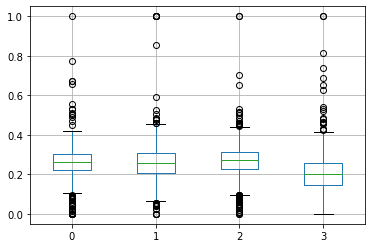

In [27]:
pd.DataFrame(u_sim100_1000_type2).boxplot()

In [26]:
import pandas as pd
round((pd.DataFrame(u_sim100_1000_type2)[1]).describe(),3)

count    956.000
mean       0.260
std        0.099
min        0.000
25%        0.209
50%        0.259
75%        0.309
max        1.000
Name: 1, dtype: float64

In [15]:
round((pd.DataFrame(u_sim100_1000_type2)[1]-pd.DataFrame(u_sim100_1000_type2)[2]).describe(),3)

count    955.000
mean      -0.034
std        0.217
min       -0.942
25%       -0.120
50%       -0.014
75%        0.071
max        0.866
dtype: float64

In [16]:
pd.DataFrame(u_sim100_1000_type2).describe()

,0,1,2,3
count,955.000000,955.000000,955.000000,955.000000
mean,0.237451,0.259040,0.292986,0.210523
std,0.105502,0.116432,0.140919,0.119090
min,0.001430,0.008959,0.009286,0.001279
25%,0.171251,0.193545,0.216864,0.133413
50%,0.237575,0.255896,0.279370,0.193705
75%,0.287371,0.313604,0.336245,0.265836
max,0.881634,0.895082,0.954473,0.882506


### n=200; sim=1000

In [18]:
np.random.seed(2021)
for i in range(1000):
    print("iteration num: ",i)
    U,W,Z,X,Y = datgenerate_2_2(200)
    Phat1, Phat0, Qhat1, Qhat0 = calculate_PQ(X,Y,Z,W)
    
    if (np.linalg.cond(Phat1) >= 1/np.finfo(Phat1.dtype).eps) or (np.linalg.cond(Phat0) >= 1/np.finfo(Phat0.dtype).eps):
        print("Phat1 or Phat0 is singular...")
        continue
    if commutabilitycheck(Phat1,Phat0,Qhat1,Qhat0)>10000:
        print("Non-commutative...")
        continue

    S_cand_list = []
    S_hat_list = []
    u_hat_list = []
    u1_hat_list = []
    u0_hat_list = []
    losslist_list = []
    loss_min_list = []
    # Take minimum loss while repeating 5 times
    for k in range(5):
        print("Repeat: ",k)
        S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
            Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=2000, learning_rate=5e-4, rho=0.5)
        print(u_hat,loss_min)
        cnt = 0 # counter for re-initialization
        while any(u_hat<0) | any(u_hat>1):
            cnt += 1
            print("Re-initialization...")        
            try:
                S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
                    Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=2000, learning_rate=5e-4, rho=0.5)
            except RuntimeError: # if S is singular
                print('Error')
                continue            
            print(u_hat,loss_min)
            if cnt > 100:
                break


        S_cand_list.append(S_cand)
        S_hat_list.append(S_hat)
        u_hat_list.append(u_hat)
        u1_hat_list.append(u1_hat)
        u0_hat_list.append(u0_hat)
        losslist_list.append(losslist)
        loss_min_list.append(loss_min)
        
#     S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
#         Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=5000, learning_rate=5e-4, rho=0.5)
#     print(u_hat)
#     cnt = 0 # counter for re-initialization
#     while any(u_hat<0) | any(u_hat>1):
#         cnt += 1
#         print("Re-initialization...")
#         S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
#             Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=5000, learning_rate=5e-4, rho=1.5)
#         print(u_hat)
# #         if cnt == 5:
# #             print('!!BREAK!!')
# #             break
    minidx = np.argmin(loss_min_list)
    u_hat = u_hat_list[minidx]
    print(u_hat,loss_min_list[minidx])
    u_hat[u_hat<0] = 0
    u_hat[u_hat>1] = 1
    if i==0:
        u_sim200_1000_type2 = [u_hat]
    else:
        u_sim200_1000_type2 = np.concatenate([u_sim200_1000_type2,[u_hat]],0)

iteration num:  0
Repeat:  0
Commutability check: 7.645759
999 1.9588193893432617 tensor([0.2722, 0.1889, 0.3046, 0.2343], grad_fn=<AddBackward0>)
1999 1.9552627801895142 tensor([0.2770, 0.1858, 0.3093, 0.2279], grad_fn=<AddBackward0>)
[0.276959   0.18579857 0.30934736 0.22789519] tensor(1.5771, grad_fn=<AddBackward0>)
Repeat:  1
Commutability check: 7.645759
999 1.9592342376708984 tensor([0.2721, 0.1887, 0.3046, 0.2346], grad_fn=<AddBackward0>)
1999 1.9552512168884277 tensor([0.2770, 0.1858, 0.3093, 0.2279], grad_fn=<AddBackward0>)
[0.27695516 0.18578547 0.30933866 0.22792067] tensor(1.5771, grad_fn=<AddBackward0>)
Repeat:  2
Commutability check: 7.645759
999 1.9589581489562988 tensor([0.2721, 0.1889, 0.3044, 0.2346], grad_fn=<AddBackward0>)
1999 1.9552488327026367 tensor([0.2770, 0.1858, 0.3093, 0.2279], grad_fn=<AddBackward0>)
[0.27695495 0.18580762 0.30931437 0.22792298] tensor(1.5771, grad_fn=<AddBackward0>)
Repeat:  3
Commutability check: 7.645759
999 1.9588819742202759 tensor([0

In [23]:
round((pd.DataFrame(u_sim200_1000_type2)[1]).describe(),3)

count    1000.000
mean        0.270
std         0.104
min         0.010
25%         0.214
50%         0.268
75%         0.316
max         0.900
Name: 1, dtype: float64

In [22]:
round((pd.DataFrame(u_sim200_1000_type2)[1]-pd.DataFrame(u_sim200_1000_type2)[2]).describe(),3)

count    1000.000
mean       -0.030
std         0.197
min        -0.946
25%        -0.093
50%        -0.011
75%         0.054
max         0.888
dtype: float64

<AxesSubplot:>

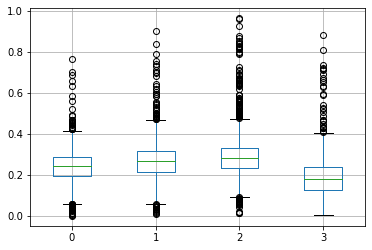

In [21]:
pd.DataFrame(u_sim200_1000_type2).boxplot()

### n=1000; sim=1000

In [16]:
np.random.seed(2021)
for i in range(1000):
    print("iteration num: ",i)
    U,W,Z,X,Y = datgenerate_2_2(1000)
    Phat1, Phat0, Qhat1, Qhat0 = calculate_PQ(X,Y,Z,W)
    
    if (np.linalg.cond(Phat1) >= 1/np.finfo(Phat1.dtype).eps) or (np.linalg.cond(Phat0) >= 1/np.finfo(Phat0.dtype).eps):
        print("Phat1 or Phat0 is singular...")
        continue
    if commutabilitycheck(Phat1,Phat0,Qhat1,Qhat0)>10000:
        print("Non-commutative...")
        continue

    S_cand_list = []
    S_hat_list = []
    u_hat_list = []
    u1_hat_list = []
    u0_hat_list = []
    losslist_list = []
    loss_min_list = []
    # Take minimum loss while repeating 5 times
    for k in range(5):
        print("Repeat: ",k)
        S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
            Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=2000, learning_rate=5e-4, rho=0.5)
        print(u_hat,loss_min)
        cnt = 0 # counter for re-initialization
        while any(u_hat<0) | any(u_hat>1):
            cnt += 1
            print("Re-initialization...")        
            try:
                S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
                    Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=2000, learning_rate=5e-4, rho=0.5)
            except RuntimeError: # if S is singular
                print('Error')
                continue            
            print(u_hat,loss_min)

        S_cand_list.append(S_cand)
        S_hat_list.append(S_hat)
        u_hat_list.append(u_hat)
        u1_hat_list.append(u1_hat)
        u0_hat_list.append(u0_hat)
        losslist_list.append(losslist)
        loss_min_list.append(loss_min)

#     S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
#         Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=5000, learning_rate=5e-4, rho=0.5)
#     print(u_hat)
#     cnt = 0 # counter for re-initialization
#     while any(u_hat<0) | any(u_hat>1):
#         cnt += 1
#         print("Re-initialization...")
#         S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
#             Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=5000, learning_rate=5e-4, rho=1.5)
#         print(u_hat)
# #         if cnt == 5:
# #             print('!!BREAK!!')
# #             break
    minidx = np.argmin(loss_min_list)
    u_hat = u_hat_list[minidx]
    print(u_hat,loss_min_list[minidx])

    u_hat[u_hat<0] = 0
    u_hat[u_hat>1] = 1
    if i==0:
        u_sim1000_1000_type2 = [u_hat]
    else:
        u_sim1000_1000_type2 = np.concatenate([u_sim1000_1000_type2,[u_hat]],0)

iteration num:  0
Repeat:  0
Commutability check: 2.7246146
999 1.3765499591827393 tensor([0.2728, 0.2330, 0.3309, 0.1633], grad_fn=<AddBackward0>)
1999 1.3746347427368164 tensor([0.2736, 0.2330, 0.3299, 0.1636], grad_fn=<AddBackward0>)
[0.2735517  0.23297627 0.32990015 0.16357198] tensor(0.9894, grad_fn=<AddBackward0>)
Repeat:  1
Commutability check: 2.7246146
999 1.3763346672058105 tensor([0.2743, 0.2329, 0.3291, 0.1637], grad_fn=<AddBackward0>)
1999 1.3745758533477783 tensor([0.2738, 0.2330, 0.3296, 0.1636], grad_fn=<AddBackward0>)
[0.27378112 0.2330199  0.32960817 0.16359071] tensor(0.9893, grad_fn=<AddBackward0>)
Repeat:  2
Commutability check: 2.7246146
999 1.3765934705734253 tensor([0.2728, 0.2330, 0.3309, 0.1633], grad_fn=<AddBackward0>)
1999 1.3746435642242432 tensor([0.2735, 0.2330, 0.3299, 0.1636], grad_fn=<AddBackward0>)
[0.2735471  0.232961   0.32991707 0.16357473] tensor(0.9894, grad_fn=<AddBackward0>)
Repeat:  3
Commutability check: 2.7246146
999 1.3762736320495605 tenso

In [202]:
u_hat_list

[array([0.161861  , 0.314252  , 0.24641639, 0.27747065], dtype=float32),
 array([0.08106608, 0.36478907, 0.3021097 , 0.25203523], dtype=float32),
 array([0.19667998, 0.5167507 , 0.15475358, 0.13181582], dtype=float32),
 array([0.33152533, 0.33231106, 0.17535853, 0.16080515], dtype=float32),
 array([0.24545911, 0.30016404, 0.20307234, 0.25130445], dtype=float32)]

In [25]:
round((pd.DataFrame(u_sim1000_1000_type2)[1]).describe(),3)

count    1000.000
mean        0.284
std         0.087
min         0.001
25%         0.257
50%         0.285
75%         0.312
max         0.853
Name: 1, dtype: float64

In [26]:
round((pd.DataFrame(u_sim1000_1000_type2)[1]-pd.DataFrame(u_sim1000_1000_type2)[2]).describe(),3)

count    1000.000
mean       -0.044
std         0.185
min        -0.961
25%        -0.064
50%        -0.014
75%         0.026
max         0.802
dtype: float64

In [27]:
pd.DataFrame(u_sim1000_1000_type2).describe()

,0,1,2,3
count,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.249393,0.284212,0.328449,0.137946
std,0.084782,0.086733,0.123146,0.063231
min,0.003151,0.001010,0.001646,0.004287
25%,0.221228,0.256531,0.274491,0.103579
50%,0.265763,0.285214,0.300996,0.131603
75%,0.292632,0.312001,0.332105,0.167231
max,0.912490,0.852641,0.968369,0.617467


In [33]:
pd.DataFrame(u_sim100_1000_type2).describe()

,0,1,2,3
count,955.000000,955.000000,955.000000,955.000000
mean,0.237451,0.259040,0.292986,0.210523
std,0.105502,0.116432,0.140919,0.119090
min,0.001430,0.008959,0.009286,0.001279
25%,0.171251,0.193545,0.216864,0.133413
50%,0.237575,0.255896,0.279370,0.193705
75%,0.287371,0.313604,0.336245,0.265836
max,0.881634,0.895082,0.954473,0.882506


### n=5000

In [15]:
np.random.seed(2021)
for i in range(1000):
    print("iteration num: ",i)
    U,W,Z,X,Y = datgenerate_2_2(5000)
    Phat1, Phat0, Qhat1, Qhat0 = calculate_PQ(X,Y,Z,W)
    
    if (np.linalg.cond(Phat1) >= 1/np.finfo(Phat1.dtype).eps) or (np.linalg.cond(Phat0) >= 1/np.finfo(Phat0.dtype).eps):
        print("Phat1 or Phat0 is singular...")
        continue
    if commutabilitycheck(Phat1,Phat0,Qhat1,Qhat0)>10000:
        print("Non-commutative...")
        continue

    S_cand_list = []
    S_hat_list = []
    u_hat_list = []
    u1_hat_list = []
    u0_hat_list = []
    losslist_list = []
    loss_min_list = []
    # Take minimum loss while repeating 5 times
    for k in range(5):
        print("Repeat: ",k)
        S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
            Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=2000, learning_rate=5e-4, rho=0.5)
        print(u_hat,loss_min)
        cnt = 0 # counter for re-initialization
        while any(u_hat<0) | any(u_hat>1):
            cnt += 1
            print("Re-initialization...")        
            try:
                S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
                    Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=2000, learning_rate=5e-4, rho=0.5)
            except RuntimeError: # if S is singular
                print('Error')
                continue            
            print(u_hat,loss_min)

        S_cand_list.append(S_cand)
        S_hat_list.append(S_hat)
        u_hat_list.append(u_hat)
        u1_hat_list.append(u1_hat)
        u0_hat_list.append(u0_hat)
        losslist_list.append(losslist)
        loss_min_list.append(loss_min)

#     S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
#         Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=5000, learning_rate=5e-4, rho=0.5)
#     print(u_hat)
#     cnt = 0 # counter for re-initialization
#     while any(u_hat<0) | any(u_hat>1):
#         cnt += 1
#         print("Re-initialization...")
#         S_cand, S_hat, u_hat, u1_hat, u0_hat, losslist, loss_min = optim(
#             Phat1, Phat0, Qhat1, Qhat0, np.sum(X==1)/X.shape[0], np.sum(X==0)/X.shape[0], maxiter=5000, learning_rate=5e-4, rho=1.5)
#         print(u_hat)
# #         if cnt == 5:
# #             print('!!BREAK!!')
# #             break
    minidx = np.argmin(loss_min_list)
    u_hat = u_hat_list[minidx]
    print(u_hat,loss_min_list[minidx])

    u_hat[u_hat<0] = 0
    u_hat[u_hat>1] = 1
    if i==0:
        u_sim5000_1000_type2 = [u_hat]
    else:
        u_sim5000_1000_type2 = np.concatenate([u_sim5000_1000_type2,[u_hat]],0)

iteration num:  0
Repeat:  0
Commutability check: 0.7417251
999 1.058211326599121 tensor([0.2936, 0.2841, 0.3138, 0.1085], grad_fn=<AddBackward0>)
1999 1.0580922365188599 tensor([0.2931, 0.2840, 0.3141, 0.1087], grad_fn=<AddBackward0>)
[0.2931464  0.2840203  0.31413633 0.10869705] tensor(0.8130, grad_fn=<AddBackward0>)
Repeat:  1
Commutability check: 0.7417251
999 1.0582202672958374 tensor([0.2937, 0.2839, 0.3139, 0.1085], grad_fn=<AddBackward0>)
1999 1.0580928325653076 tensor([0.2931, 0.2840, 0.3141, 0.1087], grad_fn=<AddBackward0>)
[0.29314822 0.28401804 0.3141367  0.10869701] tensor(0.8130, grad_fn=<AddBackward0>)
Repeat:  2
Commutability check: 0.7417251
999 1.0582228899002075 tensor([0.2937, 0.2840, 0.3138, 0.1085], grad_fn=<AddBackward0>)
1999 1.0580928325653076 tensor([0.2931, 0.2840, 0.3141, 0.1087], grad_fn=<AddBackward0>)
[0.29314798 0.28401902 0.31413633 0.10869657] tensor(0.8130, grad_fn=<AddBackward0>)
Repeat:  3
Commutability check: 0.7417251
999 1.0581921339035034 tensor

In [50]:
round((pd.DataFrame(u_sim5000_1000_type2)[1]).describe(),3)

count    1000.000
mean        0.299
std         0.082
min         0.001
25%         0.272
50%         0.300
75%         0.320
max         0.872
Name: 1, dtype: float64

In [51]:
round((pd.DataFrame(u_sim5000_1000_type2)[1]-pd.DataFrame(u_sim5000_1000_type2)[2]).describe(),3)

count    1000.000
mean       -0.034
std         0.171
min        -0.894
25%        -0.060
50%        -0.007
75%         0.030
max         0.796
dtype: float64

In [30]:
round((pd.DataFrame(u_sim200_1000_type2)[1]).describe(),3)

count    998.000
mean       0.269
std        0.086
min        0.007
25%        0.225
50%        0.269
75%        0.306
max        1.000
Name: 1, dtype: float64

In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('ggplot')

# plt.style.use('default')
sns.set()
sns.set(font_scale=1.4, font="Times New Roman")
sns.set_style('whitegrid')
sns.set_palette('Set3')

np.random.seed(2021)

df_PNS_1000_type2 = pd.DataFrame({
    'n= 100': np.concatenate([u_sim100_1000_type2[:,1],np.array([np.nan]*44)]),
    'n= 200': np.concatenate([u_sim200_1000_type2[:,1],np.array([np.nan]*2)]),
    'n=1000': u_sim1000_1000_type2[:,1],
    'n=5000': u_sim5000_1000_type2[:,1]
})

df_CD_1000_type2 = pd.DataFrame({
    'n= 100': np.concatenate([u_sim100_1000_type2[:,1],np.array([np.nan]*44)]) - np.concatenate([u_sim100_1000_type2[:,2],np.array([np.nan]*44)]),
    'n= 200': np.concatenate([u_sim200_1000_type2[:,1],np.array([np.nan]*2)]) - np.concatenate([u_sim200_1000_type2[:,2],np.array([np.nan]*2)]),
    'n=1000': u_sim1000_1000_type2[:,1] - u_sim1000_1000_type2[:,2],
    'n=5000': u_sim5000_1000_type2[:,1] - u_sim5000_1000_type2[:,2]
})

# merge the two data frames to one data frame
df_PNS_melt_1000_type2 = pd.melt(df_PNS_1000_type2)
df_PNS_melt_1000_type2['Estimator'] = 'PNS'
df_CD_melt_1000_type2 = pd.melt(df_CD_1000_type2)
df_CD_melt_1000_type2['Estimator'] = 'Causal Risk Difference'

df_1000_type2 = pd.concat([df_PNS_melt_1000_type2, df_CD_melt_1000_type2], axis=0)
df_new_1000_type2 = df_1000_type2.rename(columns={'variable': 'size'})

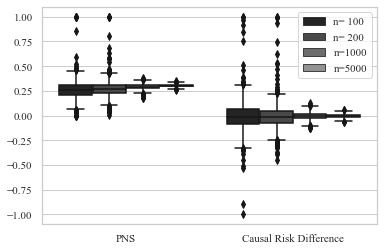

In [32]:
sns.set()
sns.set_style("darkgrid", {'font.family':'serif', 'font.serif':'Times New Roman'})
sns.set_style('whitegrid')
sns.set_palette('gray')

plt.rcParams['font.family'] = 'Times New Roman'
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
sns.boxplot(x='Estimator', y='value', data=df_new_1000_type2, hue='size', ax=ax)

ax.set_xlabel('')
ax.set_ylabel('')
ax.legend().set_title('')

plt.show()

In [33]:
df_PNS_1000_type2.to_csv("PNS_1000_type2_nearopt.csv")

In [34]:
df_CD_1000_type2.to_csv("CD_1000_type2_nearopt.csv")

In [35]:
round(df_PNS_1000_type2.describe(),3)

,n= 100,n= 200,n=1000,n=5000
count,956.000,998.000,1000.000,1000.000
mean,0.260,0.269,0.291,0.304
std,0.099,0.086,0.027,0.013
min,0.000,0.007,0.175,0.261
25%,0.209,0.225,0.274,0.295
50%,0.259,0.269,0.292,0.303
75%,0.309,0.306,0.310,0.312
max,1.000,1.000,0.379,0.345


In [37]:
round(df_CD_1000_type2.describe(),3)

,n= 100,n= 200,n=1000,n=5000
count,956.000,998.000,1000.000,1000.000
mean,-0.008,-0.005,-0.006,-0.003
std,0.151,0.123,0.038,0.020
min,-1.000,-0.450,-0.130,-0.069
25%,-0.090,-0.071,-0.029,-0.017
50%,-0.016,-0.011,-0.006,-0.002
75%,0.071,0.048,0.020,0.010
max,1.000,1.000,0.127,0.059
